In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from behav import plotting, utils, loading
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.autonotebook import tqdm
pd.set_option('display.max_columns', 500)
import seaborn as sns

/home/AD/tsainbur/anaconda3/envs/cdcp_paper/lib/python3.7/site-packages/ipykernel_launcher.py:5: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  """


In [3]:
from cdcp.experiment_info import subjects
from cdcp.paths import DATA_PATH_MAGPI
from cdcp.behavior.data import prepare_behavior_data
from cdcp.visualization.colors import colors
subjects, DATA_PATH_MAGPI

(('B1174',
  'B1426',
  'B1170',
  'B1432',
  'B1437',
  'B1433',
  'B1597',
  'B1427',
  'B1188',
  'B1244',
  'B1590',
  'B1399',
  'B1591',
  'B1252',
  'B1110',
  'B1390',
  'B1248',
  'B1593',
  'B1595',
  'B1276'),
 PosixPath('/mnt/cube/RawData/Magpi'))

### load data

In [4]:
## Runs the plotting code on my data
behav_data = loading.load_data_pandas(subjects,DATA_PATH_MAGPI)
for key, value in behav_data.items():
    behav_data[key], bins = prepare_behavior_data(value, num_bins=25)

/home/AD/tsainbur/anaconda3/envs/cdcp_paper/lib/python3.7/site-packages/ipykernel_launcher.py:2: DtypeWarning: Columns (8) have mixed types.Specify dtype option on import or set low_memory=False.
  
/home/AD/tsainbur/anaconda3/envs/cdcp_paper/lib/python3.7/site-packages/ipykernel_launcher.py:2: DtypeWarning: Columns (8,9,15,16,17) have mixed types.Specify dtype option on import or set low_memory=False.
  


In [5]:
# trials per dataset
{i:len(behav_data[i]) for i in behav_data.keys()}

{'B1174': 358106,
 'B1426': 394956,
 'B1170': 520304,
 'B1432': 769387,
 'B1437': 87702,
 'B1433': 173287,
 'B1597': 209867,
 'B1427': 396727,
 'B1188': 74724,
 'B1244': 235092,
 'B1590': 155407,
 'B1399': 114908,
 'B1591': 132668,
 'B1252': 192708,
 'B1110': 106981,
 'B1390': 130065,
 'B1248': 167319,
 'B1593': 325220,
 'B1595': 98607,
 'B1276': 170278}

In [6]:
behav_data[subjects[0]][:3]

,session,index,type_,stimulus,class_,response,correct,rt,reward,punish,cue_class,cue_id,cue_prob,num_stims,flip_cues,binary_choice,cueing,left_stim,right_stim,interpolation_point,prob_cue,prob_cued_no_cue,data_file,response_bool,interpolation,pos_bin,cue_direction
time,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-02-28 15:31:37.133368,1,5,normal,/home/bird/opdat/ts_cue_prob_multicue_stims/AE...,R,L,False,3.326432,False,True,NC,NC,0.5,1,False,True,False,A,E,0,NaN,NaN,/mnt/cube/RawData/Magpi/B1174/B1174_trialdata_...,1,AE,0,N
2019-02-28 15:32:03.886668,1,6,normal,/home/bird/opdat/ts_cue_prob_multicue_stims/AE...,L,R,False,4.199297,False,True,NC,NC,0.5,1,False,True,False,A,E,127,NaN,NaN,/mnt/cube/RawData/Magpi/B1174/B1174_trialdata_...,0,AE,24,N
2019-02-28 15:32:34.116591,1,9,normal,/home/bird/opdat/ts_cue_prob_multicue_stims/AE...,R,R,True,0.761013,True,False,NC,NC,0.5,1,False,True,False,A,E,0,NaN,NaN,/mnt/cube/RawData/Magpi/B1174/B1174_trialdata_...,0,AE,0,N


### Fit 4 parameter logistic model across cues

In [7]:
from cdcp.behavior.psychometric import FourParameterLogistic, fit_FourParameterLogistic

$$
logistic(x) = d + \frac{a-d}{1+(\frac{x}{c})^b}
$$

Where 
- $a$ is the minimum value that can be obtained
- $b$ is Hill’s slope of the curve (i.e. this is related to the steepness of the curve at point c)
- $c$ is the point of inflection (i.e. the point on the S shaped curve halfway between a and d)
- $d$ is the maximum value that can be obtained

In [8]:
interp_range = np.arange(128)

In [9]:
fit_df = pd.DataFrame(
    columns=[
        "bird",
        "cue",
        "n_points",
        "_min",
        "_max",
        "_inflection",
        "_slope",
        "model",
        "y_interp",
        "r_squared",
    ]
)

for bird in tqdm(subjects):
    for cue_id in behav_data[bird].cue_id.unique():
        if cue_id == "N":
            continue
        # subset data
        cue_df = behav_data[bird][behav_data[bird].cue_id == cue_id]
        interp_points = cue_df.interpolation_point.values.astype("float32")
        response_points = cue_df.response_bool.values.astype("float32")
        # fit model
        (
            (_min, _max, _inflection, _slope),
            results_logistic,
            y_model,
            r_squared,
        ) = fit_FourParameterLogistic(interp_points, response_points)
        # model fit
        y_interp = FourParameterLogistic(
            {"_min": _min, "_max": _max, "inflection": _inflection, "slope": _slope},
            interp_range,
        )

        fit_df.loc[len(fit_df)] = [
            bird,
            cue_id,
            len(cue_df),
            _min,
            _max,
            _inflection,
            _slope,
            results_logistic,
            y_interp,
            r_squared,
        ]

  0%|          | 0/20 [00:00<?, ?it/s]

/home/AD/tsainbur/anaconda3/envs/cdcp_paper/lib/python3.7/site-packages/pandas/core/dtypes/cast.py:881: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  element = np.asarray(element)


In [10]:
fit_df[:3]

,bird,cue,n_points,_min,_max,_inflection,_slope,model,y_interp,r_squared
0,B1174,NC,90284,0.161680,0.793706,61.799512,12.515778,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.1616796112308685, 0.1616796112308685, 0.161...",0.349366
1,B1174,CL0,63105,0.105012,0.902010,60.706236,11.638878,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.10501238808906954, 0.10501238808906954, 0.1...",0.490538
2,B1174,CN,15052,0.098019,0.887127,60.960716,8.804434,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.09801867407977083, 0.09801867407977105, 0.0...",0.483530


### Plot fits

In [11]:
from cdcp.behavior.data import sum_data, prepare_behavior_data
from cdcp.behavior.visualize_behavior import plot_summary_data

In [12]:
summary_groups = ["cue_id", "cue_direction", "cueing", "pos_bin"]
summary_data = {}
fig, axs = plt.subplots(ncols = len(subjects), nrows = 1, figsize=(4*len(subjects), 4))
for bi, bird in enumerate(tqdm(subjects)):
    
    summary_data[bird] = sum_data(behav_data[bird], groups=summary_groups)

    ax = axs.flatten()[bi]
    plot_summary_data(bird, summary_data[bird], bins, ax=ax, lines=False, error=False)
    ax.set_title(bird)
    bird_fit_df = fit_df[fit_df.bird == bird]
    for cue_id in bird_fit_df.cue.unique():
        if cue_id == 'NC': continue
        cue_row = bird_fit_df[bird_fit_df.cue == cue_id].iloc[0]
        ax.plot(interp_range, cue_row.y_interp, label = cue_id, color = colors["cue_pal"][cue_id])
    ax.legend()
    

  0%|          | 0/20 [00:00<?, ?it/s]

### view summary across all birds

In [13]:
behav_all = pd.concat([behav_data[bird] for bi, bird in enumerate(tqdm(subjects))])

  0%|          | 0/20 [00:00<?, ?it/s]

In [14]:
np.unique(behav_all.interpolation_point.astype('int'))

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127])

In [15]:
fit_df_all = pd.DataFrame(
    columns=[
        "bird",
        "cue",
        "n_points",
        "_min",
        "_max",
        "_inflection",
        "_slope",
        "model",
        "y_interp",
        "r_squared",
    ]
)
bird = "all"
for cue_id in tqdm(behav_all.cue_id.unique()):
    if cue_id == "N":
        continue
    # subset data
    cue_df = behav_all[behav_all.cue_id == cue_id]
    interp_points = cue_df.interpolation_point.values.astype("float32")
    response_points = cue_df.response_bool.values.astype("float32")
    # fit model

    (
        (_min, _max, _inflection, _slope),
        results_logistic,
        y_model,
        r_squared,
    ) = fit_FourParameterLogistic(interp_points, response_points)
    # model fit
    y_interp = FourParameterLogistic(
        {"_min": _min, "_max": _max, "inflection": _inflection, "slope": _slope},
        interp_range,
    )
    fit_df_all.loc[len(fit_df)] = [
        bird,
        cue_id,
        len(cue_df),
        _min,
        _max,
        _inflection,
        _slope,
        results_logistic,
        y_interp,
        r_squared,
    ]

  0%|          | 0/7 [00:00<?, ?it/s]

/home/AD/tsainbur/anaconda3/envs/cdcp_paper/lib/python3.7/site-packages/pandas/core/dtypes/cast.py:881: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  element = np.asarray(element)
/home/AD/tsainbur/anaconda3/envs/cdcp_paper/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3162: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).ndim


In [16]:
summary_groups = ["cue_id", "cue_direction", "cueing", "pos_bin"]

summary_data_all = sum_data(
    behav_all,
    groups=summary_groups,
)

In [17]:
summary_data_all  = summary_data_all[summary_data_all.cue_id != 'NC']

In [18]:
import matplotlib.patches as patches

In [19]:
def plt_sample_data(
    data, ax, cues="L", class_="L", color="Blue", n_plot=500, disp=0.15
):
    sub = data[(data.cue_class == cues[:2]) & (data.class_ == class_)]
    samp = np.random.choice(len(sub), n_plot)
    x = sub.interpolation_point[samp].values.astype("float32")
    y = sub.response_bool[samp].values.astype("float32")
    ax.scatter(
        x + 1 * np.random.rand(n_plot) - 1 / 2,
        y + disp * np.random.rand(n_plot) - disp / 2,
        alpha=0.25,
        s=1,
        color=color,
    )

In [20]:
behav_all[:3]

,session,index,type_,stimulus,class_,response,correct,rt,reward,punish,cue_class,cue_id,cue_prob,num_stims,flip_cues,binary_choice,cueing,left_stim,right_stim,interpolation_point,prob_cue,prob_cued_no_cue,data_file,response_bool,interpolation,pos_bin,cue_direction,self_initiated
time,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-02-28 15:31:37.133368,1,5,normal,/home/bird/opdat/ts_cue_prob_multicue_stims/AE...,R,L,False,3.326432,False,True,NC,NC,0.5,1,False,True,False,A,E,0,NaN,NaN,/mnt/cube/RawData/Magpi/B1174/B1174_trialdata_...,1,AE,0,N,NaN
2019-02-28 15:32:03.886668,1,6,normal,/home/bird/opdat/ts_cue_prob_multicue_stims/AE...,L,R,False,4.199297,False,True,NC,NC,0.5,1,False,True,False,A,E,127,NaN,NaN,/mnt/cube/RawData/Magpi/B1174/B1174_trialdata_...,0,AE,24,N,NaN
2019-02-28 15:32:34.116591,1,9,normal,/home/bird/opdat/ts_cue_prob_multicue_stims/AE...,R,R,True,0.761013,True,False,NC,NC,0.5,1,False,True,False,A,E,0,NaN,NaN,/mnt/cube/RawData/Magpi/B1174/B1174_trialdata_...,0,AE,0,N,NaN


In [21]:
fig, ax = plt.subplots(figsize=(10,5))

categories = ["L", "R"]

# Create a Rectangle patch
rect = patches.Rectangle((0,-1),63,3,facecolor='#fce5cd', zorder=-100)

# Add the patch to the Axes
ax.add_patch(rect)

# Create a Rectangle patch
rect = patches.Rectangle((63,-1),128,3,facecolor='#d9ead3', zorder=-100)

# Add the patch to the Axes
ax.add_patch(rect)

plot_summary_data('all', summary_data_all, bins, ax=ax, lines=True, error=True)

for cue_id in fit_df_all.cue.unique():
    for category in categories:
        if cue_id not in  ["CN", 'NC']:
            plt_sample_data(
                behav_all,
                ax,
                cues=cue_id,
                class_=category,
                color=colors["cue_pal"][cue_id],
                n_plot=1000,
            )


for axis in ["top", "bottom", "left", "right"]:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color("k")

ax.tick_params(axis="both", labelsize=14, pad=15)
ax.get_xaxis().set_ticks([])

ax.set_ylabel('P(Left Peck)')

ax.set_title('')

Text(0.5, 1.0, '')

### view summary for indv birds

In [22]:
summary_groups = ["cue_id", "cue_direction", "cueing", "pos_bin"]
summary_data = {}
fig, axs = plt.subplots(ncols = len(subjects), nrows = 1, figsize=(4*len(subjects), 4))
for bi, bird in enumerate(tqdm(subjects)):
    
    summary_data[bird] = sum_data(behav_data[bird], groups=summary_groups)

    ax = axs.flatten()[bi]
    plot_summary_data(bird, summary_data[bird], bins, ax=ax, lines=False, error=False)
    ax.set_title(bird)
    bird_fit_df = fit_df[fit_df.bird == bird]
    for cue_id in bird_fit_df.cue.unique():
        if cue_id == 'NC': continue
        cue_row = bird_fit_df[bird_fit_df.cue == cue_id].iloc[0]
        ax.plot(interp_range, cue_row.y_interp, label = cue_id, color = colors["cue_pal"][cue_id])
    ax.legend()
    

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

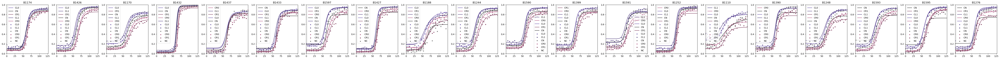

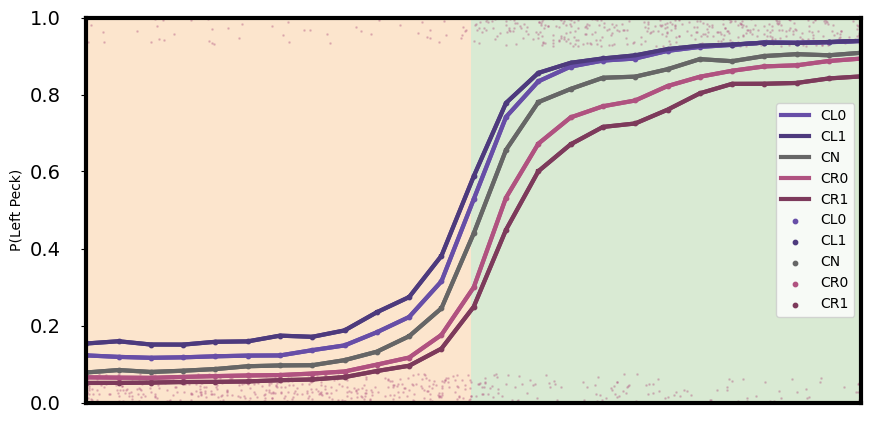

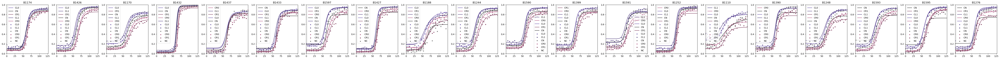

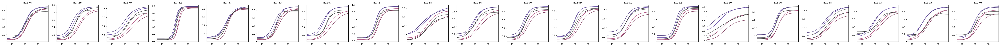

In [23]:
### This is a bit zoomed in
fig, axs = plt.subplots(ncols = len(subjects), nrows = 1, figsize=(4*len(subjects), 3))
for bi, bird in enumerate(tqdm(subjects)):
    bird_fit_df = fit_df[fit_df.bird == bird]
    # just the 
    ax = axs.flatten()[bi]
    for cue_id in bird_fit_df.cue.unique():
        cue_row = bird_fit_df[bird_fit_df.cue == cue_id].iloc[0]
        # model fit
        
        y_interp = FourParameterLogistic(
            {"_min": cue_row._min, "_max": cue_row._max, "inflection": cue_row._inflection, "slope": cue_row._slope},
            interp_range,
        )
        
        #y_interp = FourParameterLogistic(interp_range, 0, 1, cue_row._inflection, cue_row._slope)
        ax.plot(interp_range, y_interp, label = cue_id, color = colors["cue_pal"][cue_id])
    ax.set_title(bird)
    ax.set_xlim([32, 96])
plt.show()   

In [24]:
fit_df[:3]

,bird,cue,n_points,_min,_max,_inflection,_slope,model,y_interp,r_squared
0,B1174,NC,90284,0.161680,0.793706,61.799512,12.515778,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.1616796112308685, 0.1616796112308685, 0.161...",0.349366
1,B1174,CL0,63105,0.105012,0.902010,60.706236,11.638878,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.10501238808906954, 0.10501238808906954, 0.1...",0.490538
2,B1174,CN,15052,0.098019,0.887127,60.960716,8.804434,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.09801867407977083, 0.09801867407977105, 0.0...",0.483530


In [25]:
cue_strength_dict = {'CL0': 0.75, 'CL1': 0.875, 'CN': 0.5, 'CR0': 0.25, 'CR1': 0.125, 'NC': 0.5}
fit_df['cue_strength'] = [cue_strength_dict[i] for i in list(fit_df.cue.values)]

logistic_param_summary_df = (
    fit_df[np.array(["cue_strength", "cue", "_min", "_max", "_inflection", "_slope"])]
    .groupby(["cue"])
    .agg([np.mean, np.std, len])
)
logistic_param_summary_df = logistic_param_summary_df[logistic_param_summary_df.index != 'NC']

In [26]:
fig, ax = plt.subplots(figsize=(5,3))
# ax.scatter(cue_strength, inflection_point)
# ax.errorbar(cue_strength, inflection_point, yerr=inf_pt_std, xerr=None, lw=3)
for idx, row in logistic_param_summary_df.iterrows():
    ax.scatter(
        [row.cue_strength["mean"]],
        [row._inflection["mean"]],
        #color=colors["cue_pal"][row.name],
        color='k',
        s=100,
    )
    ax.errorbar(
        [row.cue_strength["mean"]],
        [row._inflection["mean"]],
        yerr=[row._inflection["std"] / np.sqrt(row._inflection["len"])],
        #color=colors["cue_pal"][row.name],
        color='k',
        lw=5,
    )
    ax.scatter(
        fit_df[fit_df["cue"] == row.name].cue_strength
        + (np.random.uniform(
            size=len(fit_df[fit_df["cue"] == row.name].cue_strength)
        )-.5)
        * 0.05,
        fit_df[fit_df["cue"] == row.name]._inflection,
        color=colors["cue_pal"][row.name],
        alpha=0.25,
    )

bound = 8
ax.set_ylim([63-bound, 63+bound])
ax.axhline(63, color="k", ls="dashed")

for axis in ["top", "bottom", "left", "right"]:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color("k")
ax.tick_params(axis="both", labelsize=14, pad=15)
ax.set_xlabel('P(RL|Cue)', fontsize=20)
ax.set_ylabel('Inflection', fontsize=20)


Text(0, 0.5, 'Inflection')

### Fit 4 param logistic across interpolations

In [27]:
fit_df_interp = pd.DataFrame(
    columns=[
        "bird",
        "cue",
        "interp",
        "n_points",
        "_min",
        "_max",
        "_inflection",
        "_slope",
        "model",
        "y_interp",
        'r_squared'
    ]
)

for bird in tqdm(subjects):
    for interpolation in tqdm(behav_data[bird].interpolation.unique(), leave=False):
        for cue_id in behav_data[bird].cue_id.unique():
            if cue_id == "N":
                continue
            # subset data
            cue_df = behav_data[bird][
                (behav_data[bird].cue_id == cue_id)
                & (behav_data[bird].interpolation == interpolation)
            ]
            interp_points = cue_df.interpolation_point.values.astype("float32")
            response_points = cue_df.response_bool.values.astype("float32")
            # fit model
            try:
                (
                    (_min, _max, _inflection, _slope),
                    results_logistic,
                    y_model,
                    r_squared,
                ) = fit_FourParameterLogistic(interp_points, response_points)
                # model fit
                y_interp = FourParameterLogistic(
                    {"_min": _min, "_max": _max, "inflection": _inflection, "slope": _slope},
                    interp_range,
                )
            except RuntimeError as e:
                print(bird, interpolation, cue_id, e)
                continue


            fit_df_interp.loc[len(fit_df_interp)] = [
                bird,
                cue_id,
                interpolation,
                len(cue_df),
                _min,
                _max,
                _inflection,
                _slope,
                results_logistic,
                y_interp,
                r_squared
            ]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

/home/AD/tsainbur/anaconda3/envs/cdcp_paper/lib/python3.7/site-packages/pandas/core/dtypes/cast.py:881: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  element = np.asarray(element)


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

/mnt/cube/tsainbur/Projects/github_repos/cdcp_chronic/cdcp/behavior/psychometric.py:42: RuntimeWarning: overflow encountered in power
  (p["_min"] - p["_max"]) / (1 + (x / p["inflection"]) ** p["slope"])


  0%|          | 0/9 [00:00<?, ?it/s]

In [28]:
fig, axs = plt.subplots(ncols=5, figsize=(24,4))
axs[0].hist(fit_df_interp._min.values, bins=50);
axs[0].set_title('min')
axs[1].hist(fit_df_interp._max.values, bins=50);
axs[1].set_title('max')
axs[2].hist(fit_df_interp._inflection.values, bins=50);
axs[2].set_title('inflection')
axs[3].hist(fit_df_interp._slope.values, bins=50);
axs[3].set_title('slope')
axs[4].hist(fit_df_interp.r_squared.values, bins=50);
axs[4].set_title('r_squared')

Text(0.5, 1.0, 'r_squared')

In [29]:
fig, axs = plt.subplots(ncols=4, figsize=(20,4))
axs[0].scatter(fit_df_interp._min.values, fit_df_interp.r_squared.values);
axs[0].set_title('min')
axs[1].scatter(fit_df_interp._max.values, fit_df_interp.r_squared.values);
axs[1].set_title('max')
axs[2].scatter(fit_df_interp._inflection.values, fit_df_interp.r_squared.values);
axs[2].set_title('inflection')
axs[3].scatter(fit_df_interp._slope.values, fit_df_interp.r_squared.values);
axs[3].set_title('slope')


Text(0.5, 1.0, 'slope')

In [30]:
fit_df_interp.sort_values(by='_inflection')

,bird,cue,interp,n_points,_min,_max,_inflection,_slope,model,y_interp,r_squared
726,B1110,CL1,AE,3855,0.204713,0.685463,41.003682,5.870625,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.20471281057792667, 0.20471281074147363, 0.2...",0.154682
975,B1595,CL1,BG,1524,0.144701,0.950157,42.420565,4.365991,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.1447008022777948, 0.14470086538195215, 0.14...",0.286329
774,B1110,CL1,BG,2166,0.430682,0.837273,42.758902,3.656360,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.4306818396254939, 0.43068228174294027, 0.43...",0.050833
778,B1110,CN,BG,438,0.181255,0.746053,44.291002,2.950483,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.18125474704986633, 0.18126258968156206, 0.1...",0.140753
777,B1110,CL0,BG,2222,0.399683,0.841499,44.860087,4.957656,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.3996834691879524, 0.3996834720447985, 0.399...",0.102553
...,...,...,...,...,...,...,...,...,...,...,...
122,B1170,CR1,BE,12429,0.107132,0.905735,92.651847,5.548432,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.10713212636691527, 0.10713212637667346, 0.1...",0.164625
743,B1110,CR1,BE,2324,0.108216,0.804801,94.980605,4.785768,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.10821577230809298, 0.10821577254713421, 0.1...",0.117674
843,B1248,CR1,BE,5963,0.117079,0.999990,97.349865,3.765794,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.11707914164376898, 0.11707917036843352, 0.1...",0.139440
760,B1110,CN,CG,430,0.266105,0.999886,101.435142,3.429335,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.26610541137058197, 0.2661055081255479, 0.26...",0.118596


## viz individual interpolations

In [31]:
summary_groups = ["cue_id", "cue_direction", "cueing", "pos_bin"]
summary_data = {}
fig, axs = plt.subplots(ncols = len(subjects), nrows = 1, figsize=(4*len(subjects), 4))
for bi, bird in enumerate(tqdm(subjects)):
    
    summary_data[bird] = sum_data(behav_data[bird], groups=summary_groups)

    ax = axs.flatten()[bi]
    plot_summary_data(bird, summary_data[bird], bins, ax=ax, lines=False, error=False)
    ax.set_title(bird)
    bird_fit_df = fit_df[fit_df.bird == bird]
    for cue_id in bird_fit_df.cue.unique():
        cue_row = bird_fit_df[bird_fit_df.cue == cue_id].iloc[0]
        ax.plot(interp_range, cue_row.y_interp, label = cue_id, color = colors["cue_pal"][cue_id])
    ax.legend()
    

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

B1174


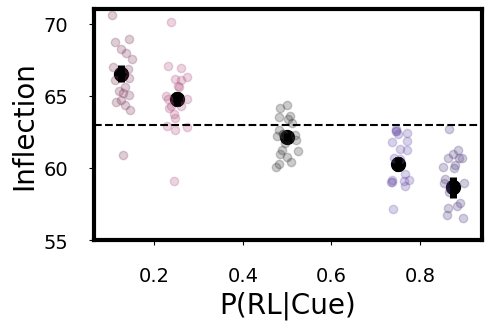

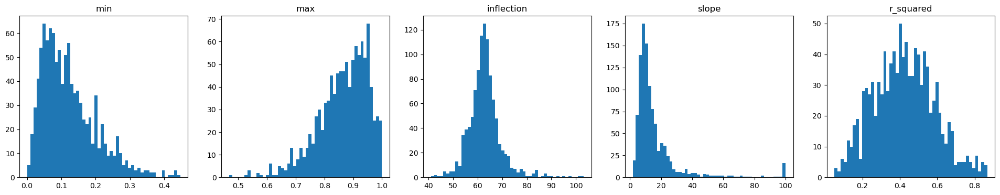

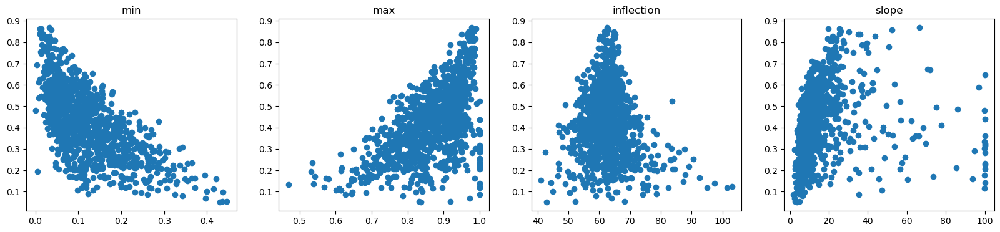

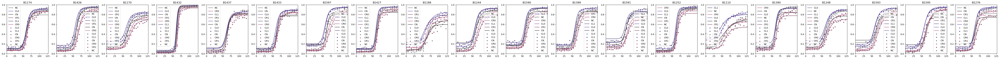

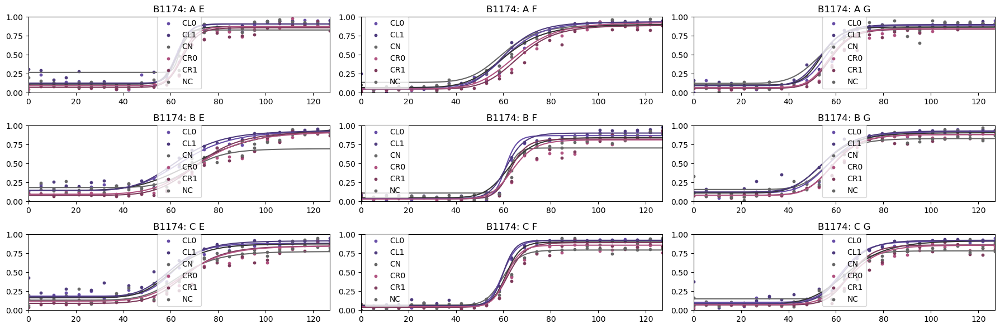

B1426


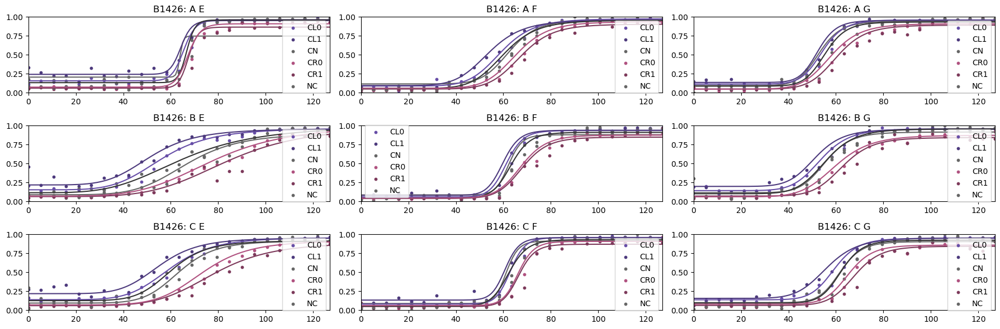

B1170


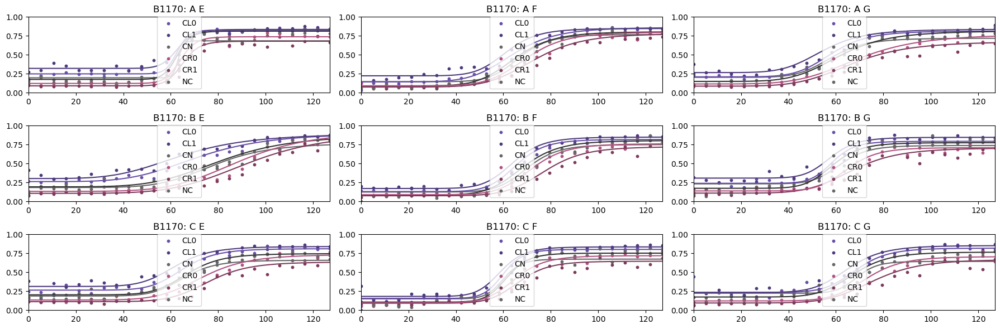

B1432


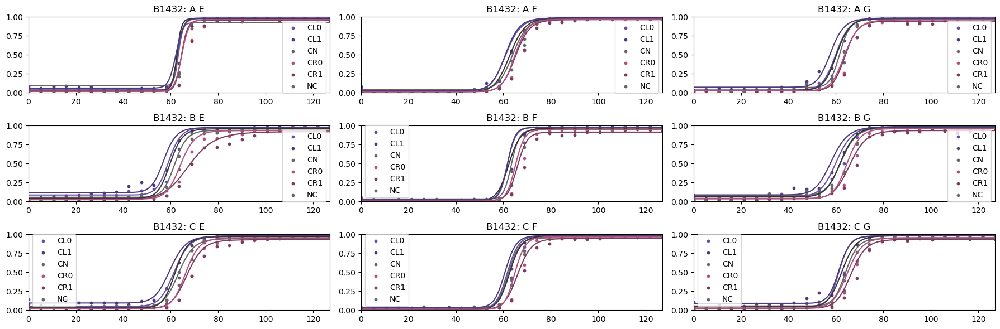

B1437


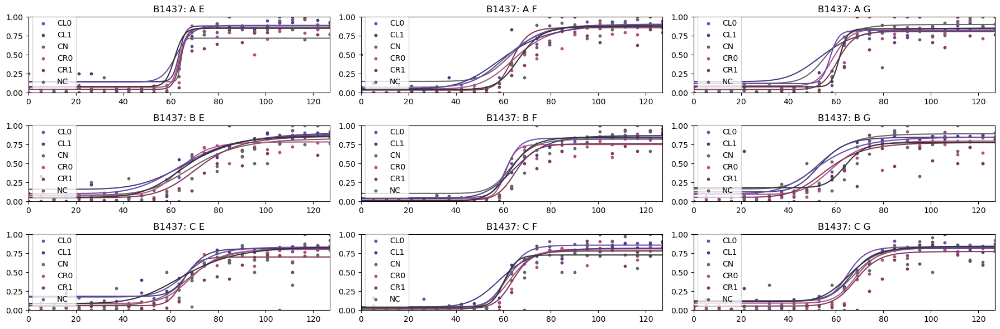

B1433


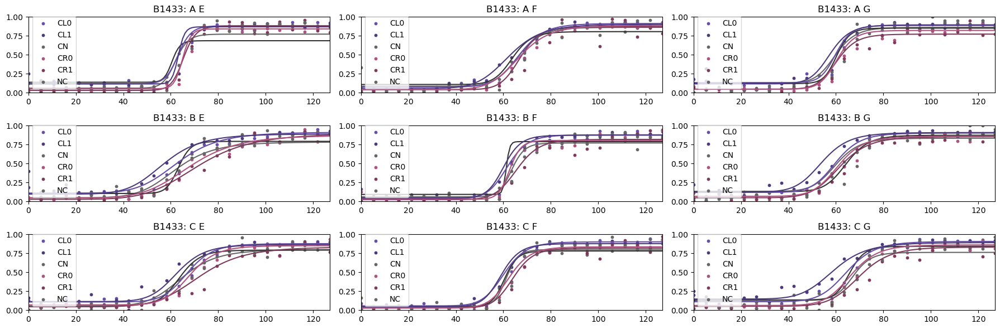

B1597


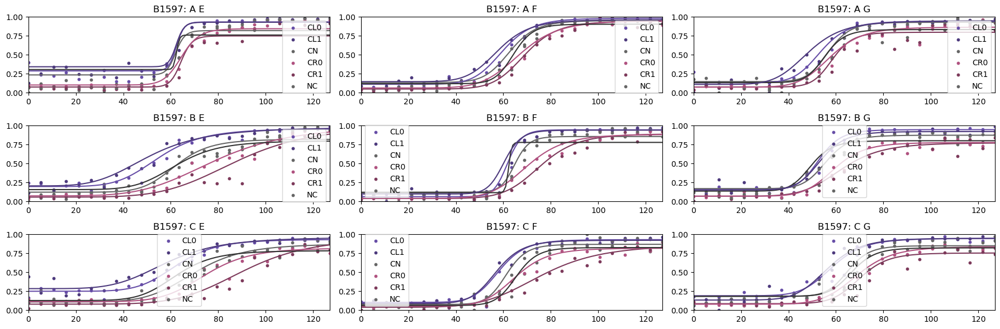

B1427


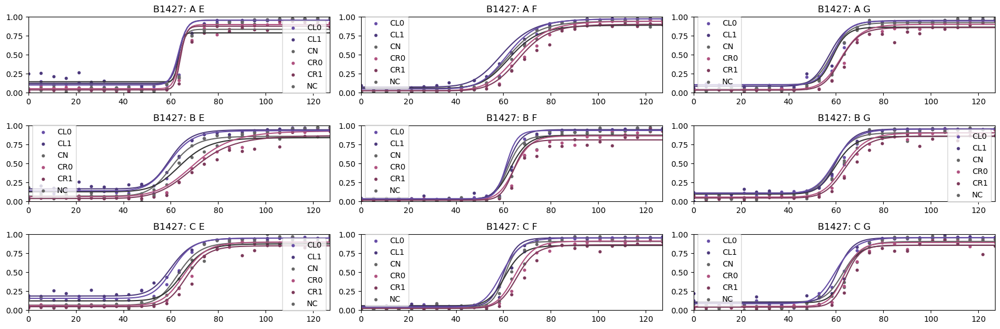

B1188


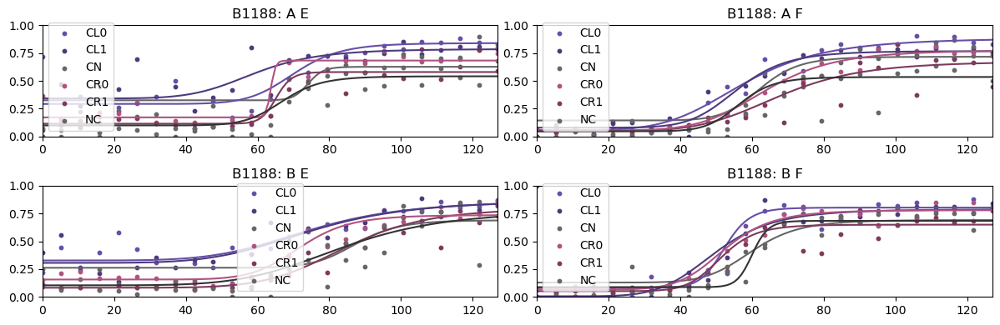

B1244


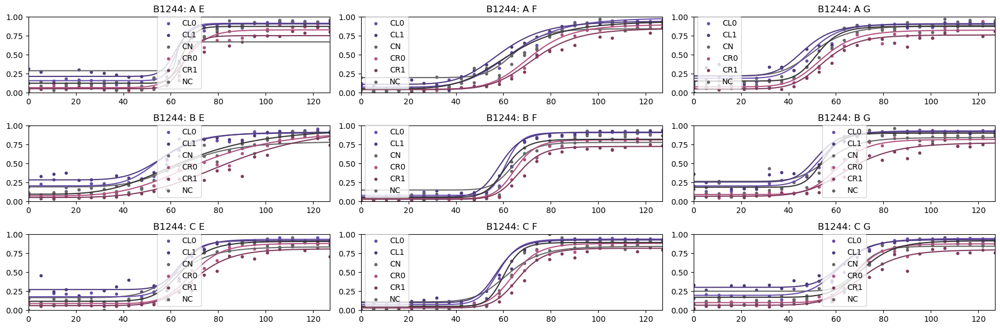

B1590


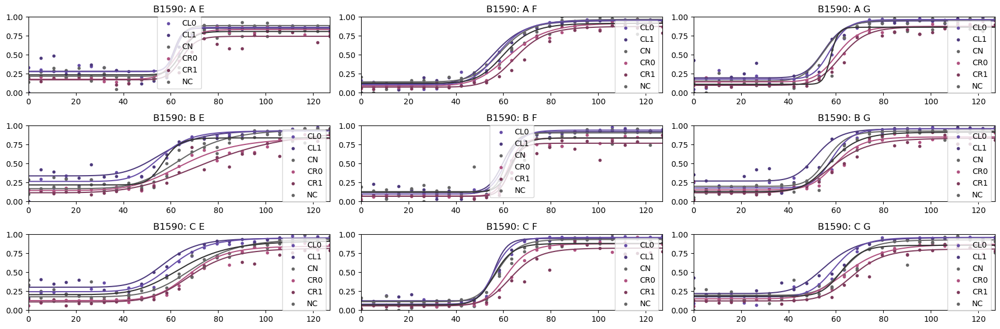

B1399


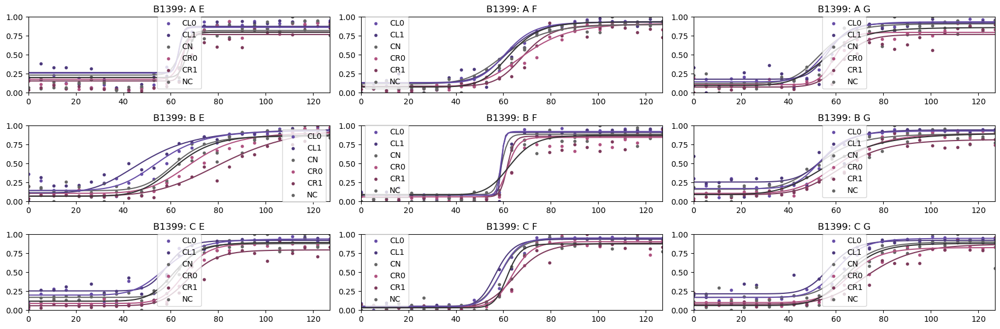

B1591


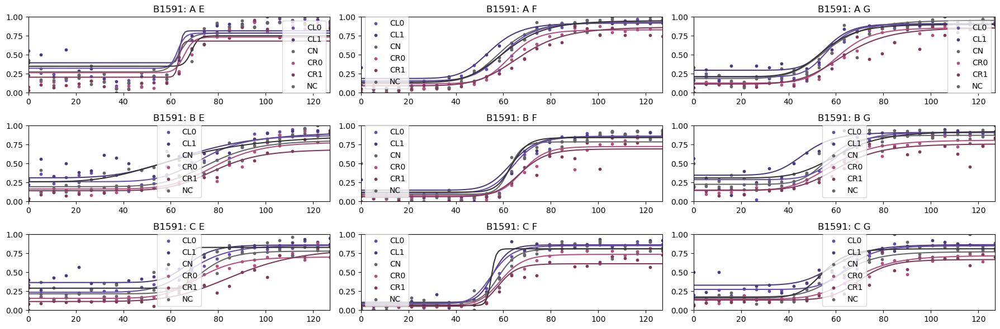

B1252


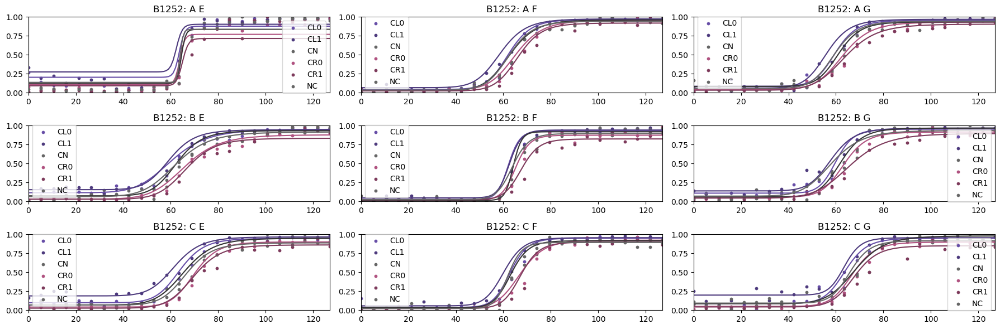

B1110


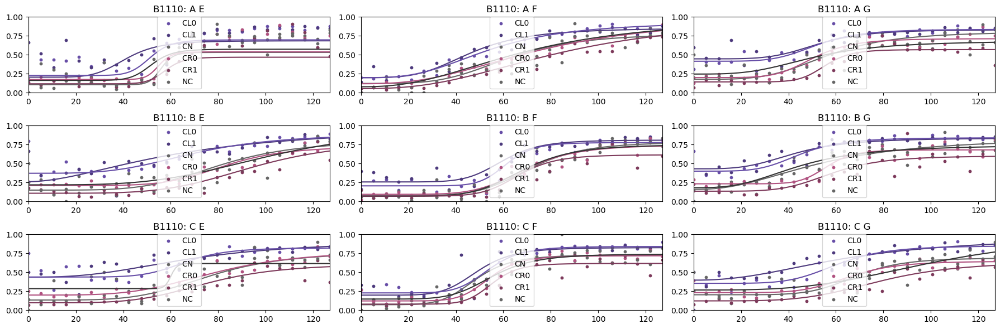

B1390


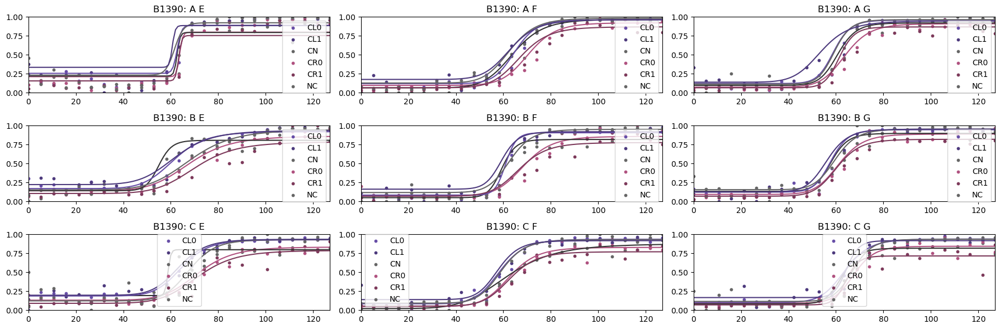

B1248


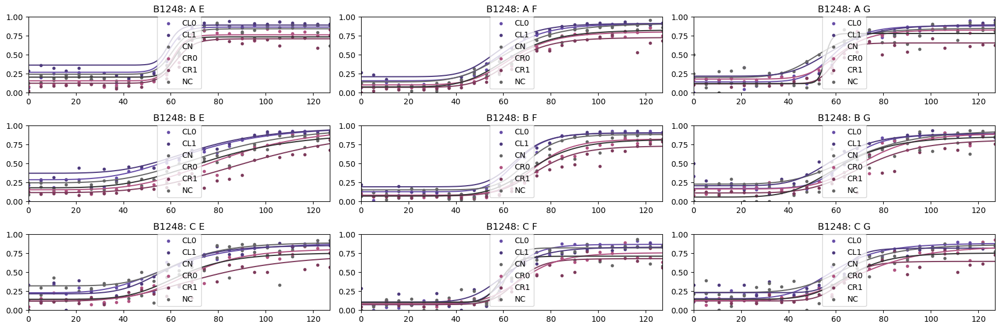

B1593


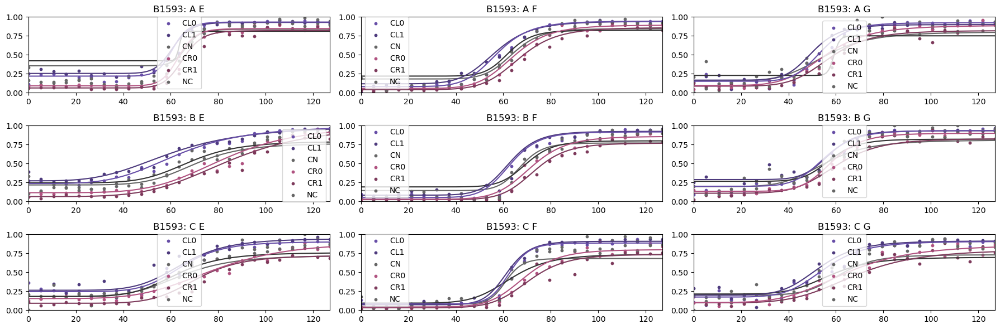

B1595


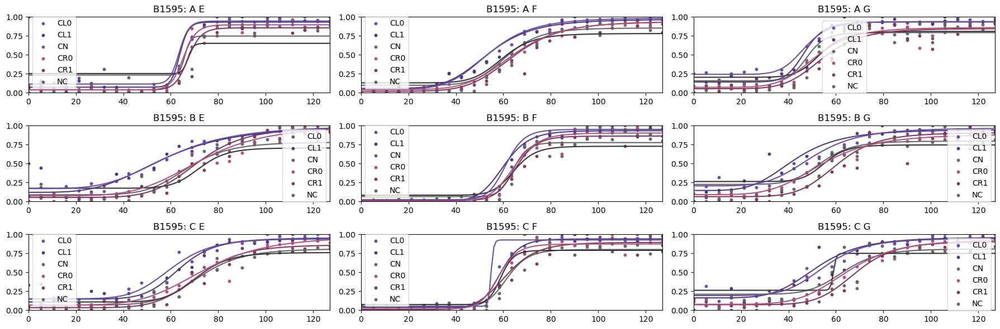

B1276


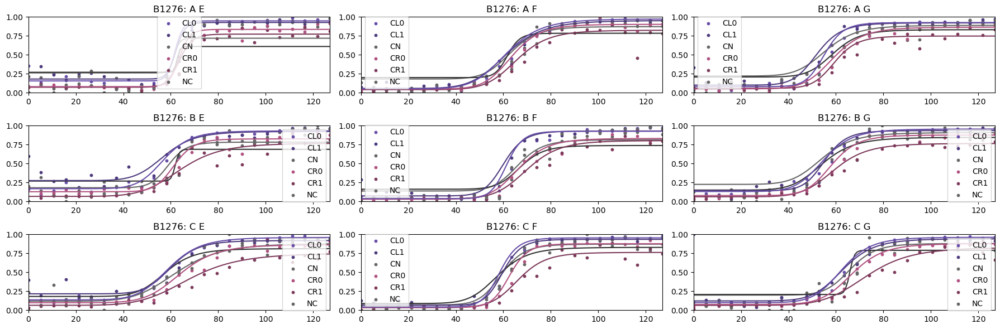

In [32]:
summary_groups = [
    "cue_id",
    "cue_direction",
    "cueing",
    "pos_bin",
    "left_stim",
    "right_stim",
]
summary_data_stims = {}

for bi, bird in enumerate(tqdm(subjects)):
    print(bird)
    summary_data_stims[bird] = sum_data(behav_data[bird], groups=summary_groups)
    left_stims = np.unique(summary_data_stims[bird].left_stim)
    right_stims = np.unique(summary_data_stims[bird].right_stim)

    fig, axs = plt.subplots(
        nrows=len(left_stims),
        ncols=len(right_stims),
        figsize=(6 * len(left_stims), 2 * len(right_stims)),
    )
    for lsi, left_stim in enumerate(left_stims):
        for rsi, right_stim in enumerate(right_stims):
            stim_df = summary_data_stims[bird][
                (summary_data_stims[bird].left_stim == left_stim)
                & (summary_data_stims[bird].right_stim == right_stim)
            ]
            ax = axs[lsi, rsi]
            
            cue_df = plot_summary_data(
                bird, stim_df, bins, ax=ax, lines=False, error=False
            )
            
            ax.set_title(bird + ": " + left_stim + " " + right_stim)
            bird_fit_df = fit_df_interp[(fit_df_interp.bird == bird) & (fit_df_interp.interp == left_stim+right_stim)]
            for cue_id in bird_fit_df.cue.unique():
                cue_row = bird_fit_df[bird_fit_df.cue == cue_id].iloc[0]
                ax.plot(interp_range, cue_row.y_interp, label = cue_id, color = colors["cue_pal"][cue_id])    
    
    plt.tight_layout()
    plt.show()

### Plot fit df as an aggregate

In [59]:
%matplotlib inline

In [60]:
fit_df_interp[:3]

,bird,cue,interp,n_points,_min,_max,_inflection,_slope,model,y_interp,r_squared,cue_strength,abs_inflection
0,B1174,NC,AE,14538,0.267878,0.827521,63.716378,53.716164,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.26787826870643316, 0.26787826870643316, 0.2...",0.310321,0.50,0.716378
1,B1174,CL0,AE,6876,0.118257,0.905289,62.506619,23.164028,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.11825659799367827, 0.11825659799367827, 0.1...",0.535872,0.75,0.493381
2,B1174,CN,AE,1606,0.114335,0.872553,62.672477,22.456672,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.11433508106196533, 0.11433508106196533, 0.1...",0.523956,0.50,0.327523


In [61]:
cue_strength_dict = {'CL0': 0.75, 'CL1': 0.875, 'CN': 0.5, 'CR0': 0.25, 'CR1': 0.125, 'NC': 0.5}
fit_df_interp['cue_strength'] = [cue_strength_dict[i] for i in list(fit_df_interp.cue.values)]

In [62]:
import scipy.stats
scipy.stats.pearsonr(fit_df_interp.cue_strength, fit_df_interp._inflection)

(-0.4411898882771735, 3.0319203692122387e-51)

In [63]:
logistic_param_summary_df = (
    fit_df_interp[np.array(["cue_strength", "cue", "_min", "_max", "_inflection", "_slope"])]
    .groupby(["cue"])
    .agg([np.mean, np.std, len])
)
logistic_param_summary_df = logistic_param_summary_df[logistic_param_summary_df.index != 'NC']

In [64]:
logistic_param_summary_df[:3]

cue_strength                _min                     _max                 \
            mean  std  len      mean       std  len      mean       std  len   
cue                                                                            
CL0        0.750  0.0  175  0.145475  0.084019  175  0.916617  0.052024  175   
CL1        0.875  0.0  175  0.170674  0.097809  175  0.916489  0.050740  175   
CN         0.500  0.0  175  0.127486  0.074378  175  0.842112  0.090889  175   

    _inflection                    _slope                  
           mean       std  len       mean        std  len  
cue                                                        
CL0   60.337918  4.470184  175  15.173049  12.838497  175  
CL1   58.767803  5.177169  175  14.789948  14.776030  175  
CN    62.600555  6.608570  175  20.995756  22.662340  175

In [65]:
len(logistic_param_summary_df)

5

In [66]:
cue_strength = logistic_param_summary_df.cue_strength['mean'].values
inflection_point = logistic_param_summary_df._inflection['mean'].values
inf_pt_std = logistic_param_summary_df._inflection['std'].values

Text(0, 0.5, 'Inflection')

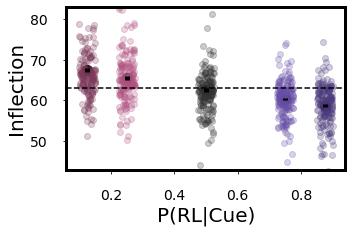

In [67]:
fig, ax = plt.subplots(figsize=(5,3))
# ax.scatter(cue_strength, inflection_point)
# ax.errorbar(cue_strength, inflection_point, yerr=inf_pt_std, xerr=None, lw=3)
for idx, row in logistic_param_summary_df.iterrows():
    ax.scatter(
        [row.cue_strength["mean"]],
        [row._inflection["mean"]],
        #color=colors["cue_pal"][row.name],
        color='k',
        s=100,
    )
    ax.errorbar(
        [row.cue_strength["mean"]],
        [row._inflection["mean"]],
        yerr=[row._inflection["std"] / np.sqrt(row._inflection["len"])],
        #color=colors["cue_pal"][row.name],
        color='k',
        lw=5,
    )
    ax.scatter(
        fit_df_interp[fit_df_interp["cue"] == row.name].cue_strength
        + (np.random.uniform(
            size=len(fit_df_interp[fit_df_interp["cue"] == row.name].cue_strength)
        )-.5)
        * 0.05,
        fit_df_interp[fit_df_interp["cue"] == row.name]._inflection,
        color=colors["cue_pal"][row.name],
        alpha=0.25,
    )

bound = 20
ax.set_ylim([63-bound, 63+bound])
ax.axhline(63, color="k", ls="dashed")

for axis in ["top", "bottom", "left", "right"]:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color("k")
ax.tick_params(axis="both", labelsize=14, pad=15)
ax.set_xlabel('P(RL|Cue)', fontsize=20)
ax.set_ylabel('Inflection', fontsize=20)


/home/AD/tsainbur/anaconda3/envs/cdcp_paper/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/home/AD/tsainbur/anaconda3/envs/cdcp_paper/lib/python3.7/site-packages/seaborn/distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/home/AD/tsainbur/anaconda3/envs/cdcp_paper/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel den

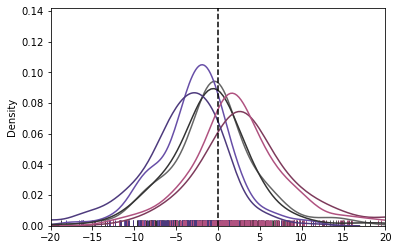

In [68]:
fig, ax = plt.subplots()
for cue in fit_df_interp.cue.unique():
    cue_df = fit_df_interp[fit_df_interp.cue == cue]
    sns.distplot(cue_df._inflection.values - 63, color = colors["cue_pal"][cue], ax = ax, rug=True, hist=False, kde=True)
ax.set_xlim([-20,20])
ax.axvline(0, color='k', ls='dashed')

### Relative shifts

In [69]:
fit_df_interp[:3]

,bird,cue,interp,n_points,_min,_max,_inflection,_slope,model,y_interp,r_squared,cue_strength,abs_inflection
0,B1174,NC,AE,14538,0.267878,0.827521,63.716378,53.716164,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.26787826870643316, 0.26787826870643316, 0.2...",0.310321,0.50,0.716378
1,B1174,CL0,AE,6876,0.118257,0.905289,62.506619,23.164028,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.11825659799367827, 0.11825659799367827, 0.1...",0.535872,0.75,0.493381
2,B1174,CN,AE,1606,0.114335,0.872553,62.672477,22.456672,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.11433508106196533, 0.11433508106196533, 0.1...",0.523956,0.50,0.327523


In [70]:
fit_df_interp[
                (fit_df_interp.bird == bird) &
                (fit_df_interp.cue == cue)
                
            ]

,bird,cue,interp,n_points,_min,_max,_inflection,_slope,model,y_interp,r_squared,cue_strength,abs_inflection
1000,B1276,CR0,AE,3264,0.079774,0.835407,63.565535,28.931810,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.07977400618550001, 0.07977400618550001, 0.0...",0.501168,0.25,0.565535
1006,B1276,CR0,BF,3422,0.029629,0.831316,66.370673,10.854095,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.029628949288270312, 0.029628949288270312, 0...",0.544917,0.25,3.370673
1012,B1276,CR0,BE,3543,0.128228,0.825495,61.473997,14.836623,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.12822757258362638, 0.12822757258362638, 0.1...",0.364970,0.25,1.526003
1018,B1276,CR0,AF,3462,0.049097,0.902484,63.483487,10.712548,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.04909736713680357, 0.04909736713680357, 0.0...",0.548242,0.25,0.483487
1024,B1276,CR0,CG,3437,0.075565,0.877957,66.695032,10.036893,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.07556510065153699, 0.07556510065153699, 0.0...",0.454256,0.25,3.695032
1030,B1276,CR0,CF,3423,0.037091,0.876601,62.610190,16.366204,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.03709086374697823, 0.03709086374697823, 0.0...",0.606673,0.25,0.389810
1036,B1276,CR0,BG,3381,0.077739,0.876094,58.068857,10.618424,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.07773855166550381, 0.07773855166550381, 0.0...",0.486313,0.25,4.931143
1042,B1276,CR0,AG,3352,0.051628,0.865426,58.920048,9.294552,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.051627586382905655, 0.051627586382905655, 0...",0.504203,0.25,4.079952
1048,B1276,CR0,CE,3339,0.098566,0.864632,64.082587,8.419691,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.0985664966864036, 0.09856649668640416, 0.09...",0.398939,0.25,1.082587


In [71]:
shifts = {}
for bi, bird in enumerate(tqdm(subjects)):
    shifts[bird] = {}
    for interp in fit_df_interp.interp.unique():
        shifts[bird][interp] = {}
        for cue in fit_df_interp.cue.unique():
            try:
                shifts[bird][interp][cue] = fit_df_interp[
                    (fit_df_interp.bird == bird) &
                    (fit_df_interp.cue == cue) &
                    (fit_df_interp.interp == interp)

                ].iloc[0]._inflection
            except IndexError as e:
                print(bird, interp, cue, e)
shifts_df = pd.concat([pd.DataFrame(shifts[bird]).T for bird in shifts.keys()])

  0%|          | 0/20 [00:00<?, ?it/s]

B1188 CE NC single positional indexer is out-of-bounds
B1188 CE CL0 single positional indexer is out-of-bounds
B1188 CE CN single positional indexer is out-of-bounds
B1188 CE CR1 single positional indexer is out-of-bounds
B1188 CE CL1 single positional indexer is out-of-bounds
B1188 CE CR0 single positional indexer is out-of-bounds
B1188 BG NC single positional indexer is out-of-bounds
B1188 BG CL0 single positional indexer is out-of-bounds
B1188 BG CN single positional indexer is out-of-bounds
B1188 BG CR1 single positional indexer is out-of-bounds
B1188 BG CL1 single positional indexer is out-of-bounds
B1188 BG CR0 single positional indexer is out-of-bounds
B1188 CF NC single positional indexer is out-of-bounds
B1188 CF CL0 single positional indexer is out-of-bounds
B1188 CF CN single positional indexer is out-of-bounds
B1188 CF CR1 single positional indexer is out-of-bounds
B1188 CF CL1 single positional indexer is out-of-bounds
B1188 CF CR0 single positional indexer is out-of-bound

In [72]:
shifts_df[:3]

,NC,CL0,CN,CR1,CL1,CR0
AE,63.716378,62.506619,62.672477,64.904589,62.993893,64.652479
BF,62.206755,60.962692,62.363495,63.128694,61.486852,63.961782
AF,59.949316,61.579365,61.011955,66.552690,60.310829,65.448330


#### Inflection shift from left to right cue

/home/AD/tsainbur/anaconda3/envs/cdcp_paper/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/AD/tsainbur/anaconda3/envs/cdcp_paper/lib/python3.7/site-packages/seaborn/distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/home/AD/tsainbur/anaconda3/envs/cdcp_paper/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  war

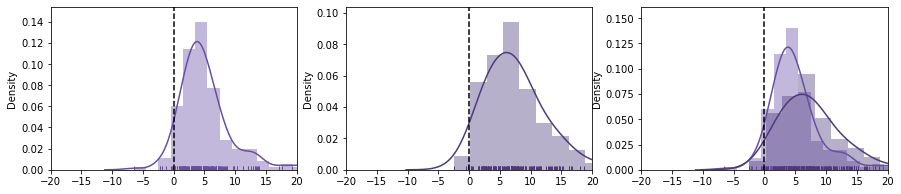

In [73]:
fig, axs = plt.subplots(ncols=3, figsize=(15,3))
ax = axs[0]
sns.distplot(
    shifts_df.CR0 - shifts_df.CL0,
    bins=15,
    color=colors["cue_pal"]["CL0"],
    ax=ax,
    rug=True,
    kde=True,
)
ax.set_xlim([-20, 20])
ax.axvline(0, color="k", ls="dashed")

ax = axs[1]
sns.distplot(
    shifts_df.CR1 - shifts_df.CL1,
    bins=15,
    color=colors["cue_pal"]["CL1"],
    ax=ax,
    rug=True,
    kde=True,
)
ax.set_xlim([-20, 20])
ax.axvline(0, color="k", ls="dashed")

ax = axs[2]
sns.distplot(
    shifts_df.CR0 - shifts_df.CL0,
    bins=15,
    color=colors["cue_pal"]["CL0"],
    ax=ax,
    rug=True,
    kde=True,
)
sns.distplot(
    shifts_df.CR1 - shifts_df.CL1,
    bins=15,
    color=colors["cue_pal"]["CL1"],
    ax=ax,
    rug=True,
    kde=True,
)




ax.set_xlim([-20, 20])
ax.axvline(0, color="k", ls="dashed")

/home/AD/tsainbur/anaconda3/envs/cdcp_paper/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/AD/tsainbur/anaconda3/envs/cdcp_paper/lib/python3.7/site-packages/seaborn/distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


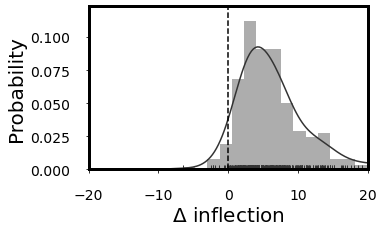

In [74]:
fig, ax = plt.subplots(ncols=1, figsize=(5,3))

sns.distplot(
    list(shifts_df.CR0 - shifts_df.CL0) + list(shifts_df.CR1 - shifts_df.CL1),
    bins=25,
    color=colors["cue_pal"]["CN"],
    ax=ax,
    rug=True,
    kde=True,
)

ax.set_xlim([-20, 20])
for axis in ["top", "bottom", "left", "right"]:
    ax.spines[axis].set_linewidth(3)
    ax.spines[axis].set_color("k")
ax.tick_params(axis="both", labelsize=14, pad=15)
ax.set_xlabel('$\Delta$ inflection', fontsize=20)
ax.set_ylabel('Probability', fontsize=20)
ax.axvline(0, color="k", ls="dashed")

/home/AD/tsainbur/anaconda3/envs/cdcp_paper/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/AD/tsainbur/anaconda3/envs/cdcp_paper/lib/python3.7/site-packages/seaborn/distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/home/AD/tsainbur/anaconda3/envs/cdcp_paper/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  war

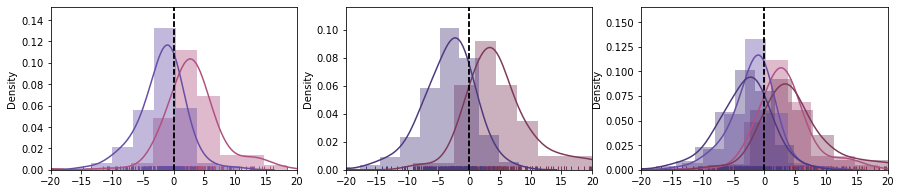

In [75]:
fig, axs = plt.subplots(ncols=3, figsize=(15,3))
ax = axs[0]
sns.distplot(
    shifts_df.CR0 - shifts_df.CN,
    bins=15,
    color=colors["cue_pal"]["CR0"],
    ax=ax,
    rug=True,
    kde=True,
)
ax.set_xlim([-20, 20])
ax.axvline(0, color="k", ls="dashed")

ax = axs[1]
sns.distplot(
    shifts_df.CR1 - shifts_df.CN,
    bins=15,
    color=colors["cue_pal"]["CR1"],
    ax=ax,
    rug=True,
    kde=True,
)
ax.set_xlim([-20, 20])
ax.axvline(0, color="k", ls="dashed")

ax = axs[2]
sns.distplot(
    shifts_df.CR0 - shifts_df.CN,
    bins=15,
    color=colors["cue_pal"]["CR0"],
    ax=ax,
    rug=True,
    kde=True,
)
sns.distplot(
    shifts_df.CR1 - shifts_df.CN,
    bins=15,
    color=colors["cue_pal"]["CR1"],
    ax=ax,
    rug=True,
    kde=True,
)
ax.set_xlim([-20, 20])
ax.axvline(0, color="k", ls="dashed")


### right

ax = axs[0]
sns.distplot(
    shifts_df.CL0 - shifts_df.CN,
    bins=15,
    color=colors["cue_pal"]["CL0"],
    ax=ax,
    rug=True,
    kde=True,
)
ax.set_xlim([-20, 20])
ax.axvline(0, color="k", ls="dashed")

ax = axs[1]
sns.distplot(
    shifts_df.CL1 - shifts_df.CN,
    bins=15,
    color=colors["cue_pal"]["CL1"],
    ax=ax,
    rug=True,
    kde=True,
)
ax.set_xlim([-20, 20])
ax.axvline(0, color="k", ls="dashed")

ax = axs[2]
sns.distplot(
    shifts_df.CL0 - shifts_df.CN,
    bins=15,
    color=colors["cue_pal"]["CL0"],
    ax=ax,
    rug=True,
    kde=True,
)
sns.distplot(
    shifts_df.CL1 - shifts_df.CN,
    bins=15,
    color=colors["cue_pal"]["CL1"],
    ax=ax,
    rug=True,
    kde=True,
)
ax.set_xlim([-20, 20])
ax.axvline(0, color="k", ls="dashed")

#### Inflection shifts vs no cue

/home/AD/tsainbur/anaconda3/envs/cdcp_paper/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


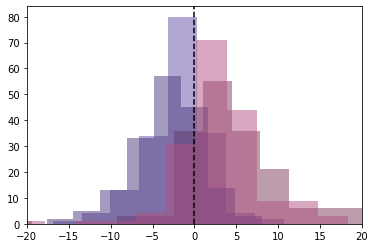

In [76]:
fig, ax = plt.subplots()

for cue in fit_df_interp.cue.unique():
    if cue in ['NC', 'CN']: continue
    sns.distplot(
        shifts_df[cue] - shifts_df.CN,
        bins=15,
        color=colors["cue_pal"][cue],
        ax=ax,
        #rug=True,
        kde=False,
        hist=True,
        hist_kws={"alpha": 0.5, 'stacked':True},
        label = cue
    )
ax.set_xlim([-20, 20])
ax.axvline(0, color="k", ls="dashed")

### relationship between variables

In [77]:
fit_df_interp[:3]

,bird,cue,interp,n_points,_min,_max,_inflection,_slope,model,y_interp,r_squared,cue_strength,abs_inflection
0,B1174,NC,AE,14538,0.267878,0.827521,63.716378,53.716164,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.26787826870643316, 0.26787826870643316, 0.2...",0.310321,0.50,0.716378
1,B1174,CL0,AE,6876,0.118257,0.905289,62.506619,23.164028,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.11825659799367827, 0.11825659799367827, 0.1...",0.535872,0.75,0.493381
2,B1174,CN,AE,1606,0.114335,0.872553,62.672477,22.456672,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.11433508106196533, 0.11433508106196533, 0.1...",0.523956,0.50,0.327523


In [78]:
fit_df_interp['abs_inflection'] = np.abs(fit_df_interp['_inflection'] - 63)

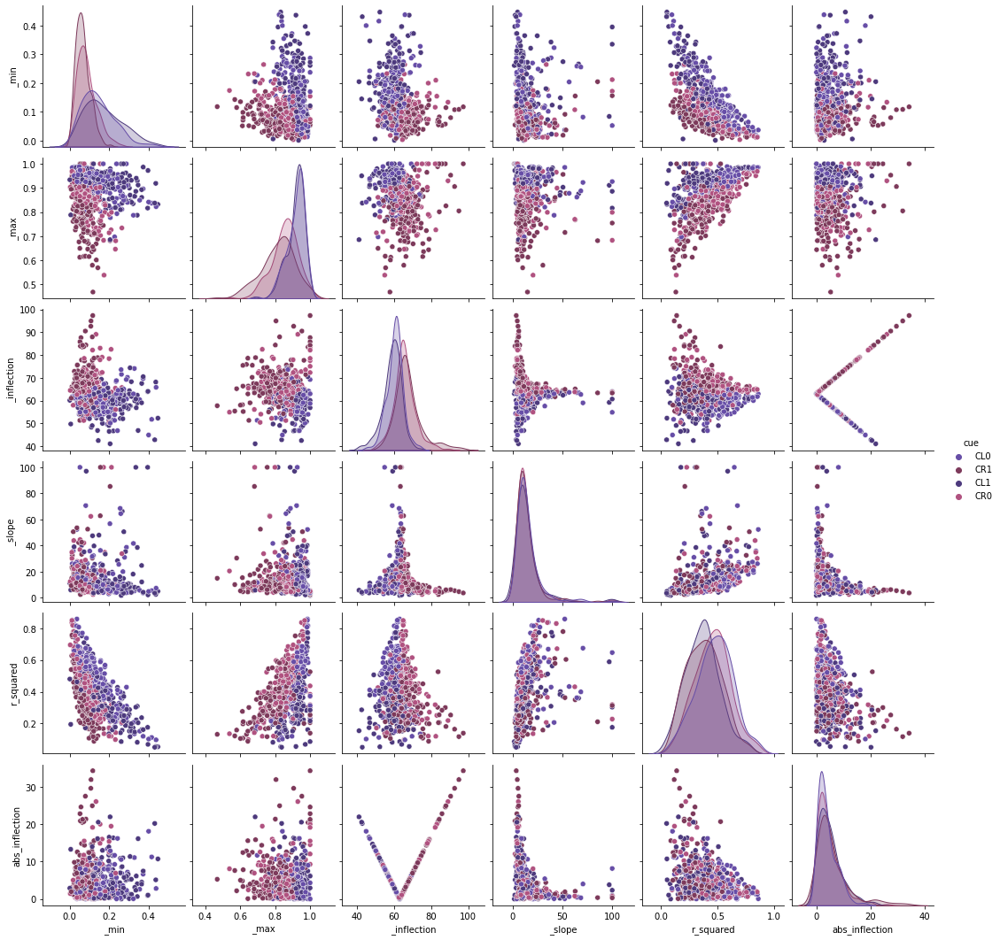

In [79]:
sns.pairplot(
    fit_df_interp[fit_df_interp.cue.isin(['N', 'NC', 'CN']) == False][
        ["cue", "_min", "_max", "_inflection", "_slope", "r_squared", "abs_inflection"]
    ],
    hue="cue",
    palette=colors["cue_pal"],
)

### slope (uncertainty in likelihood) predicts shift in categorical boundary

In [80]:
fit_df_interp[:3]

,bird,cue,interp,n_points,_min,_max,_inflection,_slope,model,y_interp,r_squared,cue_strength,abs_inflection
0,B1174,NC,AE,14538,0.267878,0.827521,63.716378,53.716164,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.26787826870643316, 0.26787826870643316, 0.2...",0.310321,0.50,0.716378
1,B1174,CL0,AE,6876,0.118257,0.905289,62.506619,23.164028,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.11825659799367827, 0.11825659799367827, 0.1...",0.535872,0.75,0.493381
2,B1174,CN,AE,1606,0.114335,0.872553,62.672477,22.456672,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.11433508106196533, 0.11433508106196533, 0.1...",0.523956,0.50,0.327523


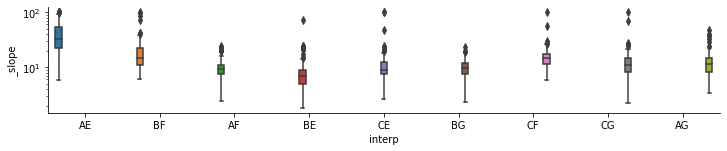

In [81]:
g = sns.catplot(x="interp", y="_slope", hue="interp", kind="box", data=fit_df_interp, height = 2, aspect = 5)
g.set(yscale="log")

In [82]:
mask = fit_df_interp.cue.isin(['N', 'NC', 'CN']) == False

cat = fit_df_interp[mask].interp.values
pal = {i:j for i, j in zip(np.unique(cat), sns.color_palette('tab10', len(np.unique(cat))))}
cols = [pal[i] for i in cat]

Text(0, 0.5, 'Inflection (log abs)')

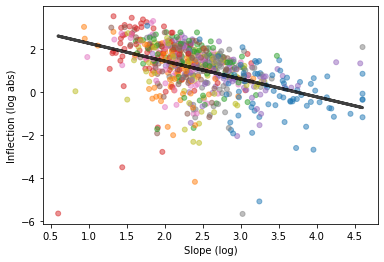

In [83]:
fig, ax = plt.subplots()
x = np.log(fit_df_interp[mask]._slope.values)
y= np.log(fit_df_interp[mask].abs_inflection.values)
ax.scatter(
    x,
    y,
    s = 25,
    alpha = 0.5,
    c = cols
)
m, b = np.polyfit(x, y, 1)
ax.plot(x, m*x + b, color = 'black', lw=3, ls = 'solid', alpha = 0.75)

ax.set_xlabel('Slope (log)')
ax.set_ylabel('Inflection (log abs)')

In [84]:
import scipy.stats

In [85]:
scipy.stats.pearsonr(np.log(fit_df_interp[mask]._slope.values), np.log(fit_df_interp[mask].abs_inflection.values))

(-0.4233646507345402, 8.170186982024529e-32)

In [86]:
fit_df_interp[:3]

,bird,cue,interp,n_points,_min,_max,_inflection,_slope,model,y_interp,r_squared,cue_strength,abs_inflection
0,B1174,NC,AE,14538,0.267878,0.827521,63.716378,53.716164,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.26787826870643316, 0.26787826870643316, 0.2...",0.310321,0.50,0.716378
1,B1174,CL0,AE,6876,0.118257,0.905289,62.506619,23.164028,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.11825659799367827, 0.11825659799367827, 0.1...",0.535872,0.75,0.493381
2,B1174,CN,AE,1606,0.114335,0.872553,62.672477,22.456672,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.11433508106196533, 0.11433508106196533, 0.1...",0.523956,0.50,0.327523


In [89]:
fit_df_interp

,bird,cue,interp,n_points,_min,_max,_inflection,_slope,model,y_interp,r_squared,cue_strength,abs_inflection
0,B1174,NC,AE,14538,0.267878,0.827521,63.716378,53.716164,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.26787826870643316, 0.26787826870643316, 0.2...",0.310321,0.500,0.716378
1,B1174,CL0,AE,6876,0.118257,0.905289,62.506619,23.164028,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.11825659799367827, 0.11825659799367827, 0.1...",0.535872,0.750,0.493381
2,B1174,CN,AE,1606,0.114335,0.872553,62.672477,22.456672,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.11433508106196533, 0.11433508106196533, 0.1...",0.523956,0.500,0.327523
3,B1174,CR1,AE,6927,0.070952,0.856316,64.904589,19.556475,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.07095212618116764, 0.07095212618116764, 0.0...",0.490980,0.125,1.904589
4,B1174,CL1,AE,6792,0.126566,0.907617,62.993893,25.696895,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.12656566865555452, 0.12656566865555452, 0.1...",0.482472,0.875,0.006107
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,B1276,CN,CE,882,0.181092,0.811774,57.720081,9.536329,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.1810915760012003, 0.1810915760012003, 0.181...",0.312632,0.500,5.279919
1046,B1276,CR1,CE,3423,0.064405,0.754110,67.676771,6.349807,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.06440542841225916, 0.06440542841390251, 0.0...",0.249772,0.125,4.676771
1047,B1276,CL1,CE,3290,0.215976,0.918714,60.194371,10.643554,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.21597634909306296, 0.21597634909306296, 0.2...",0.294832,0.875,2.805629
1048,B1276,CR0,CE,3339,0.098566,0.864632,64.082587,8.419691,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.0985664966864036, 0.09856649668640416, 0.09...",0.398939,0.250,1.082587


In [87]:
fit_df[:3]

,bird,cue,n_points,_min,_max,_inflection,_slope,model,y_interp,r_squared,cue_strength
0,B1174,NC,90284,0.161680,0.793706,61.799512,12.515778,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.1616796112308685, 0.1616796112308685, 0.161...",0.349366,0.50
1,B1174,CL0,63105,0.105012,0.902010,60.706236,11.638878,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.10501238808906954, 0.10501238808906954, 0.1...",0.490538,0.75
2,B1174,CN,15052,0.098019,0.887127,60.960716,8.804434,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.09801867407977083, 0.09801867407977105, 0.0...",0.483530,0.50


In [88]:
fit_df

,bird,cue,n_points,_min,_max,_inflection,_slope,model,y_interp,r_squared,cue_strength
0,B1174,NC,90284,0.161680,0.793706,61.799512,12.515778,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.1616796112308685, 0.1616796112308685, 0.161...",0.349366,0.500
1,B1174,CL0,63105,0.105012,0.902010,60.706236,11.638878,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.10501238808906954, 0.10501238808906954, 0.1...",0.490538,0.750
2,B1174,CN,15052,0.098019,0.887127,60.960716,8.804434,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.09801867407977083, 0.09801867407977105, 0.0...",0.483530,0.500
3,B1174,CR1,62782,0.064685,0.864298,64.005144,11.071233,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.06468485936174773, 0.06468485936174773, 0.0...",0.467595,0.125
4,B1174,CL1,63139,0.102595,0.915813,59.997519,10.858411,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.10259492271573345, 0.10259492271573345, 0.1...",0.451230,0.875
...,...,...,...,...,...,...,...,...,...,...,...
115,B1276,CN,9491,0.209644,0.742844,60.788782,16.332673,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.2096439836356504, 0.2096439836356504, 0.209...",0.256124,0.500
116,B1276,CR1,31138,0.056319,0.773533,65.078280,9.436466,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.05631908455207535, 0.05631908455207535, 0.0...",0.335045,0.125
117,B1276,CL1,30492,0.137824,0.930649,58.996379,10.919437,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.13782408596549411, 0.13782408596549411, 0.1...",0.381294,0.875
118,B1276,CR0,30623,0.070913,0.859042,62.824390,11.498389,<lmfit.minimizer.MinimizerResult object at 0x7...,"[0.07091298731824103, 0.07091298731824103, 0.0...",0.477588,0.250


In [91]:
from cdcp.paths import DATA_DIR, ensure_dir

In [93]:
fit_df.to_pickle(DATA_DIR / 'behavior_fit_df.pickle')

In [92]:
fit_df_interp.to_pickle(DATA_DIR / 'behavior_fit_interp_df.pickle')